In [1]:
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error
from tqdm import tqdm
import pickle
import os
from datetime import datetime
import json
from pathlib import Path

# Define consistent colors for plots
TRAIN_COLOR = 'steelblue'
TRAIN_FILL_COLOR = 'steelblue'
TRAIN_FILL_ALPHA = 0.3
VAL_COLOR = 'coral'
VAL_FILL_COLOR = 'coral'
VAL_FILL_ALPHA = 0.3

# Set random seeds for reproducibility
def set_seeds(seed=42):
    torch.manual_seed(seed)
    np.random.seed(seed)
    
set_seeds()

## Data Loading and Preprocessing

In [2]:
def load_data(file_path):
    """Load data from parquet file."""
    data = pd.read_parquet(file_path)
    data = data.dropna(subset=['rain', 'wind'])
    return data

def split_data(data, train_years, val_year, test_year):
    """Split data into train, validation and test sets based on years."""
    data['time_bucket'] = pd.to_datetime(data['time_bucket'])
    
    train_data = data[data['time_bucket'].dt.year.isin(train_years)]
    val_data = data[data['time_bucket'].dt.year == val_year]
    test_data = data[data['time_bucket'].dt.year == test_year]
    
    print(f"Train data size: {len(train_data)}")
    print(f"Validation data size: {len(val_data)}")
    print(f"Test data size: {len(test_data)}")
    
    return train_data, val_data, test_data

def filter_ride_data(data, ride_name):
    """Filter data for a specific ride."""
    return data[data[f'ride_name_{ride_name}'] == True].copy()

def get_all_rides(data):
    """Extract all unique rides from the dataset."""
    ride_columns = [col for col in data.columns if col.startswith('ride_name_')]
    return [col.replace('ride_name_', '') for col in ride_columns]

## Time Series Decomposition with Prophet

In [3]:
class BaseTimeSeriesModel:
    """Class to handle Prophet time series modeling with holidays."""
    
    def __init__(self):
        self.model = None
        self.forecast = None
        self.holidays = None
        
    def is_operating_month(self, ds):
        month = ds.month
        return 1 if (month >= 4 and month <= 12) else 0

    def prepare_prophet_dataframe(self, data, include_y=True):
        """Prepare data for Prophet with feature engineering."""
        prophet_df = data[['time_bucket', 'wait_time', 'temperature', 'rain']].copy()
        prophet_df = prophet_df.rename(columns={'time_bucket': 'ds', 'wait_time': 'y'})
        prophet_df['operating_month'] = prophet_df['ds'].apply(self.is_operating_month)

        if not include_y:
            prophet_df = prophet_df.drop(["y"], axis=1) 
        
        # Add additional features from prophet_model.py
        prophet_df['temp_squared'] = prophet_df['temperature'] ** 2
        prophet_df['high_temp'] = (prophet_df['temperature'] > 25).astype(int)
        prophet_df['any_rain'] = (prophet_df['rain'] > 0).astype(int)
        prophet_df['is_weekend'] = prophet_df['ds'].dt.dayofweek.isin([5, 6]).astype(int)
        prophet_df['temp_weekend'] = prophet_df['temperature'] * prophet_df['is_weekend']
        prophet_df['rain_weekend'] = prophet_df['rain'] * prophet_df['is_weekend']
        
        return prophet_df
    
    def create_holiday_dataframes(self, data):
        """Create holiday dataframes for Prophet model."""
        holiday_dfs = []
        
        # Process country holidays
        for country in ['swiss', 'german', 'french']:
            holiday_col = f"is_{country}_holiday"
            if holiday_col in data.columns:
                country_holidays = data.loc[data[holiday_col] == 1, ["time_bucket"]]
                if len(country_holidays) > 0:
                    country_holidays["ds"] = pd.to_datetime(country_holidays["time_bucket"]).dt.date
                    country_holidays = country_holidays.drop_duplicates(subset=["ds"])
                    country_holidays = country_holidays.drop(columns=["time_bucket"])
                    country_holidays["holiday"] = f"{country}_holiday"
                    country_holidays["lower_window"] = 0
                    country_holidays["upper_window"] = 0
                    holiday_dfs.append(country_holidays.reset_index(drop=True))
                # Combine all holidays
        if holiday_dfs:
            all_holidays = pd.concat(holiday_dfs)
            all_holidays["ds"] = pd.to_datetime(all_holidays["ds"])
            return all_holidays.sort_values(by=["ds"]).reset_index(drop=True)
        return None
    
    def fit(self, prophet_df):
        """Fit the Prophet model."""
        # Create holidays dataframe
        self.holidays = self.create_holiday_dataframes(prophet_df)
        
        # Create a Prophet model with configuration from prophet_model.py
        self.model = Prophet(
            # Core parameters
            seasonality_mode='multiplicative',  # Better for tourism/attraction data
            changepoint_prior_scale=0.05,       # Flexibility in trend changes
            changepoint_range=0.95,             # Allow changepoints closer to the end

            # Handling seasonality
            seasonality_prior_scale=12,         # Stronger seasonality influence
            yearly_seasonality=True,            # Capture yearly patterns
            weekly_seasonality=True,            # Capture weekly patterns
            daily_seasonality=True,             # Custom daily seasonality for operating hours

            # Specific to park operation
            holidays_prior_scale=15,            # Strong holiday effects for parks
            holidays=self.holidays,             # Include holidays and covid periods
            interval_width=0.95                 # 95% confidence interval
        )
                
        # Add weather and interaction regressors
        self.model.add_regressor('temperature', mode='multiplicative', standardize=True)
        self.model.add_regressor('rain', mode='multiplicative', standardize=True)
        self.model.add_regressor('temp_squared', mode='additive', standardize=True)
        self.model.add_regressor('high_temp', mode='multiplicative', standardize=False)
        self.model.add_regressor('any_rain', mode='multiplicative', standardize=False)
        self.model.add_regressor('temp_weekend', mode='additive', standardize=True)
        self.model.add_regressor('rain_weekend', mode='multiplicative', standardize=True)
        
        prophet_df['during_covid_era'] = 0
        covid_period = (prophet_df['ds'] >= '2020-04-15') & (prophet_df['ds'] <= '2020-05-20')
        prophet_df.loc[covid_period, 'during_covid_era'] = 1
        self.model.add_regressor('during_covid_era')
        
        prophet_df['covid_recovery'] = 0
        recovery_period = (prophet_df['ds'] >= '2021-05-21') & (prophet_df['ds'] <= '2021-08-31')
        prophet_df.loc[recovery_period, 'covid_recovery'] = 1
        self.model.add_regressor('covid_recovery')

        self.model.fit(prophet_df)
        return self.model

    def predict(self, future_df):
        """Generate predictions with the fitted model."""
        # Add required columns for prediction if they're not already present
        future_df = future_df.copy()
        future_df['operating_month'] = future_df['ds'].apply(self.is_operating_month)
        
        # Add COVID regressors if they're not already present
        if 'during_covid_era' not in future_df.columns:
            future_df['during_covid_era'] = 0
            covid_period = (future_df['ds'] >= '2020-04-15') & (future_df['ds'] <= '2020-05-20')
            future_df.loc[covid_period, 'during_covid_era'] = 1
            
        if 'covid_recovery' not in future_df.columns:
            future_df['covid_recovery'] = 0
            recovery_period = (future_df['ds'] >= '2021-05-21') & (future_df['ds'] <= '2021-08-31')
            future_df.loc[recovery_period, 'covid_recovery'] = 1
        
        # Make predictions
        self.forecast = self.model.predict(future_df)
        
        # Apply post-processing
        self.forecast = self.post_process_forecast(self.forecast)
        
        return self.forecast
    
    def post_process_forecast(self, forecast):
        """Apply corrections to forecasted values."""
        forecast = forecast.copy()
        
        # Correct negative predictions
        negative_mask = forecast['yhat'] < 0
        forecast.loc[negative_mask, 'yhat'] = 0
        forecast.loc[negative_mask, 'yhat_lower'] = 0
        forecast.loc[negative_mask, 'yhat_upper'] = 0
        
        return forecast
    
    def merge_predictions(self, original_data, forecast_data):
        """Merge original data with forecasts and calculate residuals."""
        result = original_data.copy()
        
        # Identify forecast columns to keep
        forecast_columns = ['ds', 'trend', 'yhat', 'yhat_lower', 'yhat_upper']
        for component in ['operating_season', 'weekly', 'daily']:
            if component in forecast_data.columns:
                forecast_columns.append(component)
        
        result = pd.merge(
            result, 
            forecast_data[forecast_columns], 
            left_on='time_bucket', 
            right_on='ds', 
            how='left'
        )
        
        result['residual'] = result['wait_time'] - result['yhat']
        return result

## Feature Engineering

## Model Evaluation Functions

In [4]:
def evaluate_model(ride_df, actual_values, predictions, title=""):
    """
    Evaluate model performance and generate visualizations.
    
    Parameters:
    -----------
    ride_df : pandas.DataFrame
        DataFrame containing ride data
    actual_values : numpy.ndarray
        Array of actual wait times
    predictions : numpy.ndarray
        Array of predicted wait times
    title : str
        Title for the plots
        
    Returns:
    --------
    dict
        Dictionary of evaluation metrics
    """
    # Calculate metrics
    mae = np.mean(np.abs(predictions - actual_values))
    rmse = np.sqrt(np.mean(np.square(predictions - actual_values)))
    
    # For MAPE, avoid division by zero
    epsilon = 1e-8
    abs_pct_errors = np.abs(actual_values - predictions) / (np.abs(actual_values) + epsilon)
    # Only include points where actual values are non-zero
    non_zero_mask = actual_values > 0
    mape = np.mean(abs_pct_errors[non_zero_mask]) * 100
    
    # Print metrics
    print(f"\n{title} MAE: {mae:.2f} minutes")
    print(f"{title} RMSE: {rmse:.2f} minutes")
    print(f"{title} MAPE: {mape:.2f}%")
    
    # Create a DataFrame with results for time-based analysis
    results_df = pd.DataFrame({
        'time_bucket': ride_df['time_bucket'].values,
        'actual': actual_values,
        'predicted': predictions,
    })
    
    # Add time components
    results_df['hour'] = results_df['time_bucket'].dt.hour
    results_df['day_of_week'] = results_df['time_bucket'].dt.dayofweek
    results_df['month'] = results_df['time_bucket'].dt.month
    
    # Calculate errors
    results_df['error'] = results_df['predicted'] - results_df['actual']
    results_df['abs_error'] = np.abs(results_df['error'])
    results_df['pct_error'] = abs_pct_errors * 100
    
    # Visualize results
    fig, axes = plt.subplots(2, 1, figsize=(12, 16))
    
    # Actual vs Predicted scatter plot
    axes[0].scatter(actual_values, predictions, alpha=0.5)
    max_val = max(np.max(actual_values), np.max(predictions))
    axes[0].plot([0, max_val], [0, max_val], 'k--')
    axes[0].set_xlabel('Actual Wait Time (minutes)')
    axes[0].set_ylabel('Predicted Wait Time (minutes)')
    axes[0].set_title(f'{title} - Actual vs Predicted')
    
    # Hourly analysis
    hourly_errors = results_df.groupby('hour')['abs_error'].mean()
    hourly_errors.plot(kind='bar', ax=axes[1])
    axes[1].set_xlabel('Hour of Day')
    axes[1].set_ylabel('Mean Absolute Error (minutes)')
    axes[1].set_title(f'{title} - Error Analysis by Hour of Day')
    
    plt.tight_layout()
    
    # Create metrics dictionary
    metrics = {
        "mae": mae,
        "rmse": rmse,
        "mape": mape
    }
    
    return metrics, results_df

## Model Storage Functions

In [5]:
def save_model(ride_name, prophet_model, metrics, output_dir="models"):
    """
    Save trained models and results.
    
    Parameters:
    -----------
    ride_name : str
        Name of the ride
    prophet_model : BaseTimeSeriesModel
        Trained Prophet model
    metrics : dict
        Dictionary of evaluation metrics
    output_dir : str
        Directory to save models and results
    """
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # Create ride-specific directory
    ride_dir = os.path.join(output_dir, ride_name.replace(" ", "_"))
    os.makedirs(ride_dir, exist_ok=True)
    
    # Save Prophet model (using pickle)
    with open(os.path.join(ride_dir, "prophet_model.pkl"), "wb") as f:
        pickle.dump(prophet_model.model, f)
    
    # Save holidays if they exist
    if prophet_model.holidays is not None:
        prophet_model.holidays.to_csv(os.path.join(ride_dir, "holidays.csv"), index=False)
    
    # Save metrics
    with open(os.path.join(ride_dir, "metrics.json"), "w") as f:
        json.dump(metrics, f, indent=4)
    
    print(f"Models and results saved to {ride_dir}")

def load_model(ride_name, output_dir="models"):
    """
    Load trained models and results.
    
    Parameters:
    -----------
    ride_name : str
        Name of the ride
    output_dir : str
        Directory to load models and results from
        
    Returns:
    --------
    tuple
        (prophet_model, metrics)
    """
    # Create ride-specific directory path
    ride_dir = os.path.join(output_dir, ride_name.replace(" ", "_"))
    
    # Check if models exist
    if not os.path.exists(ride_dir):
        return None, None
    
    # Load Prophet model
    try:
        with open(os.path.join(ride_dir, "prophet_model.pkl"), "rb") as f:
            prophet_model_obj = pickle.load(f)
    except:
        print(f"Could not load model for {ride_name}")
        return None, None
    
    # Initialize BaseTimeSeriesModel and set the loaded model
    prophet_ts = BaseTimeSeriesModel()
    prophet_ts.model = prophet_model_obj
    
    # Load holidays if they exist
    if os.path.exists(os.path.join(ride_dir, "holidays.csv")):
        prophet_ts.holidays = pd.read_csv(os.path.join(ride_dir, "holidays.csv"))
    
    # Load metrics
    with open(os.path.join(ride_dir, "metrics.json"), "r") as f:
        metrics = json.load(f)
    
    return prophet_ts, metrics

def get_processed_rides(output_dir="models"):
    """
    Get a list of rides that have already been processed.
    
    Parameters:
    -----------
    output_dir : str
        Directory to check for processed rides
        
    Returns:
    --------
    list
        List of processed ride names
    """
    if not os.path.exists(output_dir):
        return []
    
    # Get all subdirectories in the output directory
    processed_rides = [d for d in os.listdir(output_dir) 
                      if os.path.isdir(os.path.join(output_dir, d))]
    
    # Convert directory names back to ride names
    processed_rides = [ride.replace("_", " ") for ride in processed_rides]
    
    return processed_rides

## Multi-Ride Processing

In [6]:
def create_checkpoint_file(processed_rides, output_dir="models"):
    """Create a checkpoint file with the list of processed rides."""
    checkpoint_path = os.path.join(output_dir, "checkpoint.json")
    with open(checkpoint_path, "w") as f:
        json.dump({"processed_rides": processed_rides}, f, indent=4)

def load_checkpoint_file(output_dir="models"):
    """Load the checkpoint file to get the list of processed rides."""
    checkpoint_path = os.path.join(output_dir, "checkpoint.json")
    if os.path.exists(checkpoint_path):
        with open(checkpoint_path, "r") as f:
            checkpoint = json.load(f)
        return checkpoint.get("processed_rides", [])
    return []

## Training Pipeline for Single Ride

In [7]:
def process_single_ride(ride_name, train_data, val_data, output_dir="models"):
    """
    Process a single ride: train models, evaluate, and save results.
    
    Parameters:
    -----------
    ride_name : str
        Name of the ride to process
    train_data : pandas.DataFrame
        Training data
    val_data : pandas.DataFrame
        Validation data
    output_dir : str
        Directory to save models and results
        
    Returns:
    --------
    dict
        Dictionary of validation metrics
    """
    print(f"\n{'='*50}")
    print(f"Processing ride: {ride_name}")
    print(f"{'='*50}")
    
    # Filter data for the current ride
    ride_train_data = filter_ride_data(train_data, ride_name)
    ride_val_data = filter_ride_data(val_data, ride_name)
    
    print(f"Training data size: {len(ride_train_data)}")
    print(f"Validation data size: {len(ride_val_data)}")
    
    # Skip if not enough data
    if len(ride_train_data) < 100 or len(ride_val_data) < 50:
        print(f"Skipping {ride_name} due to insufficient data")
        return None
    
    # Train Prophet model
    print("Training Prophet model...")
    prophet_ts = BaseTimeSeriesModel()
    prophet_df = prophet_ts.prepare_prophet_dataframe(ride_train_data)
    prophet_model = prophet_ts.fit(prophet_df)
    
    # Generate Prophet forecasts for validation data
    future_val = prophet_ts.prepare_prophet_dataframe(ride_val_data, include_y=False)
    val_forecast = prophet_ts.predict(future_val)
    
    # Merge predictions with original data
    ride_val_data_with_forecast = pd.merge(
        ride_val_data,
        val_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']],
        left_on='time_bucket', 
        right_on='ds',
        how='left'
    )
    
    # Evaluate on validation set
    print("Evaluating on validation set...")
    val_actuals = ride_val_data_with_forecast['wait_time'].values
    val_predictions = ride_val_data_with_forecast['yhat'].values
    
    # Evaluate and visualize results
    val_metrics, val_results_df = evaluate_model(
        ride_val_data_with_forecast, val_actuals, val_predictions, 
        title=f"{ride_name} - Validation"
    )
    
    # Create figures directory
    fig_dir = os.path.join(output_dir, ride_name.replace(" ", "_"), "figures")
    os.makedirs(fig_dir, exist_ok=True)
    
    # Save model components visualization
    fig_components = prophet_ts.model.plot_components(val_forecast, figsize=(14, 10))
    fig_components.savefig(os.path.join(fig_dir, "model_components.png"))
    
    # Save results
    combined_metrics = {
        "validation": val_metrics,
        "data_counts": {
            "train": len(ride_train_data),
            "validation": len(ride_val_data)
        },
        "timestamp": datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    }
    
    # Save models and results
    save_model(ride_name, prophet_ts, combined_metrics, output_dir)
    
    # Save detailed results as CSV
    results_dir = os.path.join(output_dir, ride_name.replace(" ", "_"), "results")
    os.makedirs(results_dir, exist_ok=True)
    val_results_df.to_csv(os.path.join(results_dir, "validation_results.csv"), index=False)
    
    return combined_metrics

## Training Pipeline for All Rides

In [8]:
def generate_summary_report(all_results, output_dir="models"):
    """
    Generate a summary report of all ride models.
    
    Parameters:
    -----------
    all_results : dict
        Dictionary of results for all rides
    output_dir : str
        Directory to save the summary report
    """
    # Create lists to store summary data
    rides = []
    val_mae = []
    val_rmse = []
    val_mape = []
    data_counts = []
    
    # Extract data from results
    for ride_name, metrics in all_results.items():
        if not metrics:
            continue
            
        rides.append(ride_name)
        
        # Validation metrics
        val_metrics = metrics.get("validation", {})
        val_mae.append(val_metrics.get("mae", float('nan')))
        val_rmse.append(val_metrics.get("rmse", float('nan')))
        val_mape.append(val_metrics.get("mape", float('nan')))
                
        # Data counts
        counts = metrics.get("data_counts", {})
        data_counts.append(f"Train: {counts.get('train', 0)}, Val: {counts.get('validation', 0)}")
    
    # Create DataFrame
    summary_df = pd.DataFrame({
        "Ride Name": rides,
        "Validation MAE": val_mae,
        "Validation RMSE": val_rmse,
        "Validation MAPE": val_mape,
        "Data Counts": data_counts
    })
    
    # Sort by validation MAE
    summary_df = summary_df.sort_values("Validation MAE")
    
    # Save to CSV
    summary_path = os.path.join(output_dir, "model_summary.csv")
    summary_df.to_csv(summary_path, index=False)
    
    # Print a brief summary
    print("\n" + "="*80)
    print("Model Summary:")
    print(f"Total rides processed: {len(summary_df)}")
    print(f"Average validation MAE: {np.mean(val_mae):.2f}")
    print(f"Average validation RMSE: {np.mean(val_rmse):.2f}")
    print(f"Summary saved to: {summary_path}")
    print("="*80)
    
    # Create a visualization of the results
    plt.figure(figsize=(14, 8))
    
    # Sort rides by validation MAE for the plot
    plot_df = summary_df.sort_values("Validation MAE")
    
    # Plot MAE bars
    plt.barh(plot_df["Ride Name"], plot_df["Validation MAE"])
    plt.xlabel("Mean Absolute Error (minutes)")
    plt.ylabel("Ride Name")
    plt.title("Prophet Model Performance by Ride")
    plt.tight_layout()
    
    # Save the plot
    plt.savefig(os.path.join(output_dir, "model_performance_summary.png"))
    plt.close()

def process_all_rides(all_rides, train_data, val_data, 
                      output_dir="models", resume=True):
    """
    Process all rides, with support for resuming from checkpoints.
    
    Parameters:
    -----------
    all_rides : list
        List of all ride names to process
    train_data : pandas.DataFrame
        Training data
    val_data : pandas.DataFrame
        Validation data
    output_dir : str
        Directory to save models and results
    resume : bool
        Whether to resume from a previous run
    """
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Get list of already processed rides
    processed_rides = []
    if resume:
        processed_rides = load_checkpoint_file(output_dir)
        if processed_rides:
            print(f"Resuming from checkpoint. {len(processed_rides)} rides already processed.")
    
    # Initialize results dictionary
    all_results = {}
    
    # Process each ride
    for i, ride_name in enumerate(all_rides):
        if ride_name in processed_rides:
            print(f"Skipping {ride_name} (already processed)")
            # Load metrics for the summary
            _, metrics = load_model(ride_name, output_dir)
            if metrics:
                all_results[ride_name] = metrics
            continue
            
        print(f"\nProcessing ride {i+1}/{len(all_rides)}: {ride_name}")
        ride_metrics = process_single_ride(ride_name, train_data, val_data, 
                                            output_dir=output_dir)
        
        if ride_metrics:
            all_results[ride_name] = ride_metrics
            processed_rides.append(ride_name)
            
            # Update checkpoint after each ride
            create_checkpoint_file(processed_rides, output_dir)
                
            
    # Generate summary report
    generate_summary_report(all_results, output_dir)
    
    return all_results

## Main Execution

Loading data...
Loaded data with 757577 rows
Train data size: 516849
Validation data size: 126627
Test data size: 114101
Found 31 rides in the dataset:
1. alpine express enzian
2. arena of football  be part of it
3. arthur
4. atlantica supersplash
5. atlantis adventure
6. baaa express
7. blue fire megacoaster
8. castello dei medici
9. dancing dingie
10. euromir
11. eurosat  cancan coaster
12. eurotower
13. fjordrafting
14. jim button  journey through morrowland
15. josefinas magical imperial journey
16. kolumbusjolle
17. madame freudenreich curiosits
18. matterhornblitz
19. old mac donalds tractor fun
20. pegasus
21. poppy towers
22. poseidon
23. silver star
24. swiss bob run
25. tirol log flume
26. vienna wave swing  glckspilz
27. vindjammer
28. voletarium
29. volo da vinci
30. voltron nevera powered by rimac
31. whale adventures  northern lights

Processing ride 1/31: alpine express enzian

Processing ride: alpine express enzian
Training data size: 17751
Validation data size: 4123
Tr

16:57:10 - cmdstanpy - INFO - Chain [1] start processing
16:57:36 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

alpine express enzian - Validation MAE: 11.19 minutes
alpine express enzian - Validation RMSE: 13.70 minutes
alpine express enzian - Validation MAPE: 91.12%
Models and results saved to ../models/prophet_enhanced/alpine_express_enzian

Processing ride 2/31: arena of football  be part of it

Processing ride: arena of football  be part of it
Training data size: 16225
Validation data size: 4137
Training Prophet model...


16:57:38 - cmdstanpy - INFO - Chain [1] start processing
16:57:55 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

arena of football  be part of it - Validation MAE: 12.48 minutes
arena of football  be part of it - Validation RMSE: 14.32 minutes
arena of football  be part of it - Validation MAPE: 239.59%
Models and results saved to ../models/prophet_enhanced/arena_of_football__be_part_of_it

Processing ride 3/31: arthur

Processing ride: arthur
Training data size: 17748
Validation data size: 4232
Training Prophet model...


16:57:58 - cmdstanpy - INFO - Chain [1] start processing
16:58:30 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

arthur - Validation MAE: 8.80 minutes
arthur - Validation RMSE: 11.73 minutes
arthur - Validation MAPE: 36.19%
Models and results saved to ../models/prophet_enhanced/arthur

Processing ride 4/31: atlantica supersplash

Processing ride: atlantica supersplash
Training data size: 16905
Validation data size: 4232
Training Prophet model...


16:58:33 - cmdstanpy - INFO - Chain [1] start processing
16:59:01 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

atlantica supersplash - Validation MAE: 71.18 minutes
atlantica supersplash - Validation RMSE: 82.79 minutes
atlantica supersplash - Validation MAPE: 706.59%
Models and results saved to ../models/prophet_enhanced/atlantica_supersplash

Processing ride 5/31: atlantis adventure

Processing ride: atlantis adventure
Training data size: 17712
Validation data size: 4233
Training Prophet model...


16:59:04 - cmdstanpy - INFO - Chain [1] start processing
16:59:12 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

atlantis adventure - Validation MAE: 4.14 minutes
atlantis adventure - Validation RMSE: 5.30 minutes
atlantis adventure - Validation MAPE: 59.26%
Models and results saved to ../models/prophet_enhanced/atlantis_adventure

Processing ride 6/31: baaa express

Processing ride: baaa express
Training data size: 17742
Validation data size: 4234
Training Prophet model...


16:59:14 - cmdstanpy - INFO - Chain [1] start processing
16:59:48 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

baaa express - Validation MAE: 6.82 minutes
baaa express - Validation RMSE: 9.01 minutes
baaa express - Validation MAPE: 94.77%
Models and results saved to ../models/prophet_enhanced/baaa_express

Processing ride 7/31: blue fire megacoaster

Processing ride: blue fire megacoaster
Training data size: 17719
Validation data size: 4234
Training Prophet model...


16:59:51 - cmdstanpy - INFO - Chain [1] start processing
17:00:18 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

blue fire megacoaster - Validation MAE: 26.08 minutes
blue fire megacoaster - Validation RMSE: 31.62 minutes
blue fire megacoaster - Validation MAPE: 89.13%
Models and results saved to ../models/prophet_enhanced/blue_fire_megacoaster

Processing ride 8/31: castello dei medici

Processing ride: castello dei medici
Training data size: 18321
Validation data size: 4232
Training Prophet model...


17:00:21 - cmdstanpy - INFO - Chain [1] start processing
17:00:41 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

castello dei medici - Validation MAE: 3.69 minutes
castello dei medici - Validation RMSE: 4.50 minutes
castello dei medici - Validation MAPE: 29.33%
Models and results saved to ../models/prophet_enhanced/castello_dei_medici

Processing ride 9/31: dancing dingie

Processing ride: dancing dingie
Training data size: 17743
Validation data size: 4232
Training Prophet model...


17:00:44 - cmdstanpy - INFO - Chain [1] start processing
17:01:15 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

dancing dingie - Validation MAE: 4.22 minutes
dancing dingie - Validation RMSE: 5.59 minutes
dancing dingie - Validation MAPE: 98.69%
Models and results saved to ../models/prophet_enhanced/dancing_dingie

Processing ride 10/31: euromir

Processing ride: euromir
Training data size: 17709
Validation data size: 4199
Training Prophet model...


17:01:18 - cmdstanpy - INFO - Chain [1] start processing
17:01:42 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

euromir - Validation MAE: 19.94 minutes
euromir - Validation RMSE: 24.40 minutes
euromir - Validation MAPE: 97.58%
Models and results saved to ../models/prophet_enhanced/euromir

Processing ride 11/31: eurosat  cancan coaster

Processing ride: eurosat  cancan coaster
Training data size: 17122
Validation data size: 4234
Training Prophet model...


17:01:45 - cmdstanpy - INFO - Chain [1] start processing
17:02:20 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

eurosat  cancan coaster - Validation MAE: 11.96 minutes
eurosat  cancan coaster - Validation RMSE: 15.12 minutes
eurosat  cancan coaster - Validation MAPE: 42.98%


/tmp/ipykernel_12321/693202197.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(12, 16))


Models and results saved to ../models/prophet_enhanced/eurosat__cancan_coaster

Processing ride 12/31: eurotower

Processing ride: eurotower
Training data size: 17761
Validation data size: 4234
Training Prophet model...


17:02:23 - cmdstanpy - INFO - Chain [1] start processing
17:02:43 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

eurotower - Validation MAE: 3.83 minutes
eurotower - Validation RMSE: 5.06 minutes
eurotower - Validation MAPE: 54.01%
Models and results saved to ../models/prophet_enhanced/eurotower

Processing ride 13/31: fjordrafting

Processing ride: fjordrafting
Training data size: 16897
Validation data size: 4233
Training Prophet model...


17:02:46 - cmdstanpy - INFO - Chain [1] start processing
17:03:08 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

fjordrafting - Validation MAE: 8.29 minutes
fjordrafting - Validation RMSE: 10.98 minutes
fjordrafting - Validation MAPE: 76.25%
Models and results saved to ../models/prophet_enhanced/fjordrafting

Processing ride 14/31: jim button  journey through morrowland

Processing ride: jim button  journey through morrowland
Training data size: 13988
Validation data size: 4232
Training Prophet model...


17:03:11 - cmdstanpy - INFO - Chain [1] start processing
17:03:28 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

jim button  journey through morrowland - Validation MAE: 7.78 minutes
jim button  journey through morrowland - Validation RMSE: 9.27 minutes
jim button  journey through morrowland - Validation MAPE: 123.38%
Models and results saved to ../models/prophet_enhanced/jim_button__journey_through_morrowland

Processing ride 15/31: josefinas magical imperial journey

Processing ride: josefinas magical imperial journey
Training data size: 18460
Validation data size: 4234
Training Prophet model...


17:03:31 - cmdstanpy - INFO - Chain [1] start processing
17:03:51 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

josefinas magical imperial journey - Validation MAE: 3.85 minutes
josefinas magical imperial journey - Validation RMSE: 6.51 minutes
josefinas magical imperial journey - Validation MAPE: 99.47%
Models and results saved to ../models/prophet_enhanced/josefinas_magical_imperial_journey

Processing ride 16/31: kolumbusjolle

Processing ride: kolumbusjolle
Training data size: 17749
Validation data size: 4234
Training Prophet model...


17:03:54 - cmdstanpy - INFO - Chain [1] start processing
17:04:06 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

kolumbusjolle - Validation MAE: 1.62 minutes
kolumbusjolle - Validation RMSE: 2.09 minutes
kolumbusjolle - Validation MAPE: 27.17%
Models and results saved to ../models/prophet_enhanced/kolumbusjolle

Processing ride 17/31: madame freudenreich curiosits

Processing ride: madame freudenreich curiosits
Training data size: 16080
Validation data size: 4233
Training Prophet model...


17:04:08 - cmdstanpy - INFO - Chain [1] start processing
17:04:27 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

madame freudenreich curiosits - Validation MAE: 0.08 minutes
madame freudenreich curiosits - Validation RMSE: 0.53 minutes
madame freudenreich curiosits - Validation MAPE: 99.80%
Models and results saved to ../models/prophet_enhanced/madame_freudenreich_curiosits

Processing ride 18/31: matterhornblitz

Processing ride: matterhornblitz
Training data size: 17731
Validation data size: 4231
Training Prophet model...


17:04:30 - cmdstanpy - INFO - Chain [1] start processing
17:04:54 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

matterhornblitz - Validation MAE: 21.49 minutes
matterhornblitz - Validation RMSE: 25.69 minutes
matterhornblitz - Validation MAPE: 88.84%
Models and results saved to ../models/prophet_enhanced/matterhornblitz

Processing ride 19/31: old mac donalds tractor fun

Processing ride: old mac donalds tractor fun
Training data size: 17743
Validation data size: 4232
Training Prophet model...


17:04:57 - cmdstanpy - INFO - Chain [1] start processing
17:05:22 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

old mac donalds tractor fun - Validation MAE: 1.68 minutes
old mac donalds tractor fun - Validation RMSE: 2.35 minutes
old mac donalds tractor fun - Validation MAPE: 69.23%
Models and results saved to ../models/prophet_enhanced/old_mac_donalds_tractor_fun

Processing ride 20/31: pegasus

Processing ride: pegasus
Training data size: 17743
Validation data size: 4234
Training Prophet model...


17:05:30 - cmdstanpy - INFO - Chain [1] start processing
17:05:54 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

pegasus - Validation MAE: 9.87 minutes
pegasus - Validation RMSE: 12.74 minutes
pegasus - Validation MAPE: 90.87%
Models and results saved to ../models/prophet_enhanced/pegasus

Processing ride 21/31: poppy towers

Processing ride: poppy towers
Training data size: 17706
Validation data size: 4231
Training Prophet model...


17:05:57 - cmdstanpy - INFO - Chain [1] start processing
17:06:23 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

poppy towers - Validation MAE: 1.74 minutes
poppy towers - Validation RMSE: 2.43 minutes
poppy towers - Validation MAPE: 28.09%
Models and results saved to ../models/prophet_enhanced/poppy_towers

Processing ride 22/31: poseidon

Processing ride: poseidon
Training data size: 17666
Validation data size: 4230
Training Prophet model...


17:06:27 - cmdstanpy - INFO - Chain [1] start processing
17:07:01 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

poseidon - Validation MAE: 31.41 minutes
poseidon - Validation RMSE: 47.17 minutes
poseidon - Validation MAPE: 102.60%
Models and results saved to ../models/prophet_enhanced/poseidon

Processing ride 23/31: silver star

Processing ride: silver star
Training data size: 17615
Validation data size: 4230
Training Prophet model...


17:07:04 - cmdstanpy - INFO - Chain [1] start processing
17:07:27 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

silver star - Validation MAE: 8.09 minutes
silver star - Validation RMSE: 10.30 minutes
silver star - Validation MAPE: 51.42%
Models and results saved to ../models/prophet_enhanced/silver_star

Processing ride 24/31: swiss bob run

Processing ride: swiss bob run
Training data size: 18488
Validation data size: 4233
Training Prophet model...


17:07:29 - cmdstanpy - INFO - Chain [1] start processing
17:07:51 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

swiss bob run - Validation MAE: 7.65 minutes
swiss bob run - Validation RMSE: 9.74 minutes
swiss bob run - Validation MAPE: 35.40%
Models and results saved to ../models/prophet_enhanced/swiss_bob_run

Processing ride 25/31: tirol log flume

Processing ride: tirol log flume
Training data size: 17715
Validation data size: 4124
Training Prophet model...


17:07:54 - cmdstanpy - INFO - Chain [1] start processing
17:08:34 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

tirol log flume - Validation MAE: 11.97 minutes
tirol log flume - Validation RMSE: 15.79 minutes
tirol log flume - Validation MAPE: 98.51%
Models and results saved to ../models/prophet_enhanced/tirol_log_flume

Processing ride 26/31: vienna wave swing  glckspilz

Processing ride: vienna wave swing  glckspilz
Training data size: 13798
Validation data size: 4234
Training Prophet model...


17:08:37 - cmdstanpy - INFO - Chain [1] start processing
17:08:41 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

vienna wave swing  glckspilz - Validation MAE: 3.82 minutes
vienna wave swing  glckspilz - Validation RMSE: 4.46 minutes
vienna wave swing  glckspilz - Validation MAPE: 71.42%
Models and results saved to ../models/prophet_enhanced/vienna_wave_swing__glckspilz

Processing ride 27/31: vindjammer

Processing ride: vindjammer
Training data size: 17668
Validation data size: 4230
Training Prophet model...


17:08:44 - cmdstanpy - INFO - Chain [1] start processing
17:09:12 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

vindjammer - Validation MAE: 8.55 minutes
vindjammer - Validation RMSE: 9.65 minutes
vindjammer - Validation MAPE: 159.85%
Models and results saved to ../models/prophet_enhanced/vindjammer

Processing ride 28/31: voletarium

Processing ride: voletarium
Training data size: 13818
Validation data size: 4234
Training Prophet model...


17:09:15 - cmdstanpy - INFO - Chain [1] start processing
17:09:40 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

voletarium - Validation MAE: 16.62 minutes
voletarium - Validation RMSE: 20.21 minutes
voletarium - Validation MAPE: 172.66%
Models and results saved to ../models/prophet_enhanced/voletarium

Processing ride 29/31: volo da vinci

Processing ride: volo da vinci
Training data size: 17755
Validation data size: 4233
Training Prophet model...


17:09:43 - cmdstanpy - INFO - Chain [1] start processing
17:09:59 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

volo da vinci - Validation MAE: 4.80 minutes
volo da vinci - Validation RMSE: 6.09 minutes
volo da vinci - Validation MAPE: 38.60%
Models and results saved to ../models/prophet_enhanced/volo_da_vinci

Processing ride 30/31: voltron nevera powered by rimac

Processing ride: voltron nevera powered by rimac
Training data size: 0
Validation data size: 0
Skipping voltron nevera powered by rimac due to insufficient data

Processing ride 31/31: whale adventures  northern lights

Processing ride: whale adventures  northern lights
Training data size: 17771
Validation data size: 4229
Training Prophet model...


17:10:02 - cmdstanpy - INFO - Chain [1] start processing
17:10:31 - cmdstanpy - INFO - Chain [1] done processing


Evaluating on validation set...

whale adventures  northern lights - Validation MAE: 1.42 minutes
whale adventures  northern lights - Validation RMSE: 2.24 minutes
whale adventures  northern lights - Validation MAPE: 59.86%
Models and results saved to ../models/prophet_enhanced/whale_adventures__northern_lights

Model Summary:
Total rides processed: 30
Average validation MAE: 11.17
Average validation RMSE: 14.05
Summary saved to: ../models/prophet_enhanced/model_summary.csv


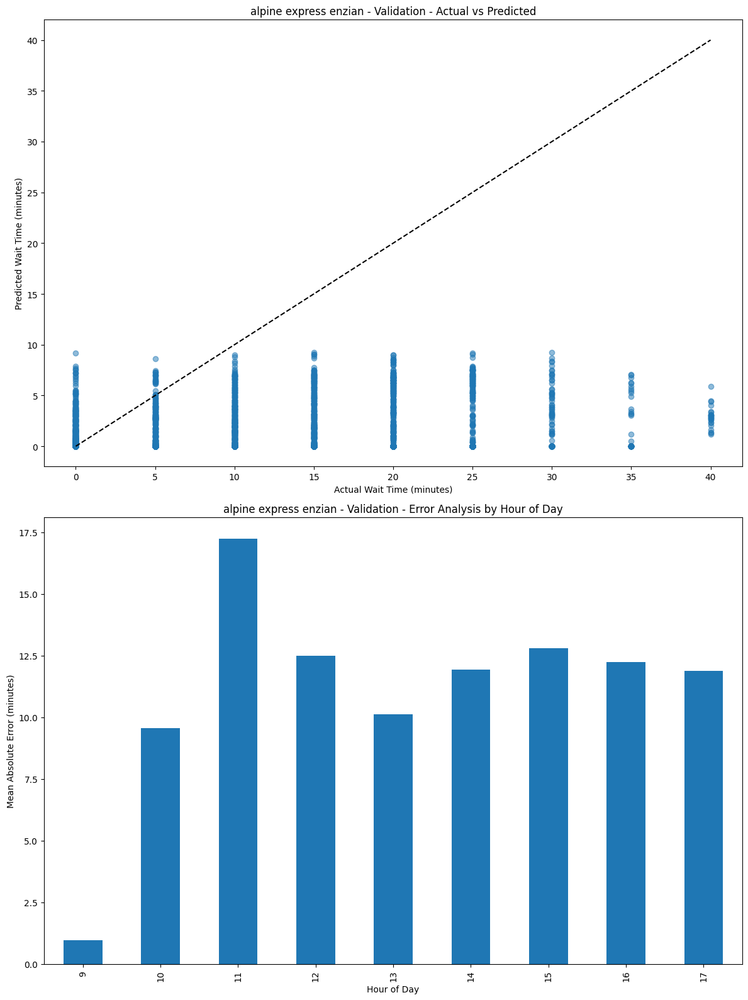

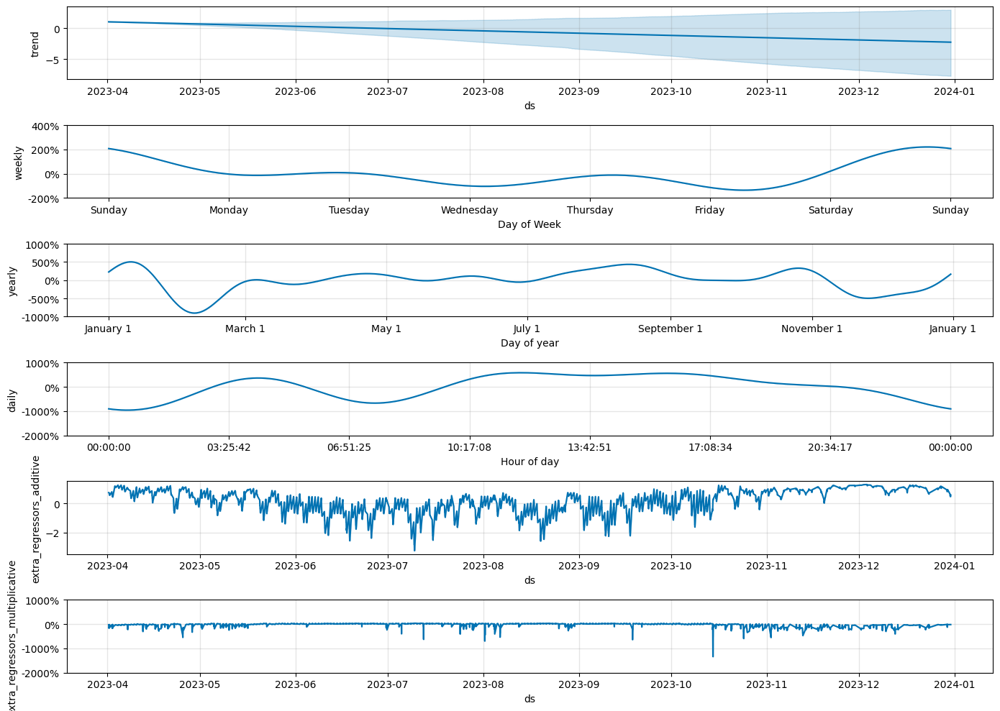

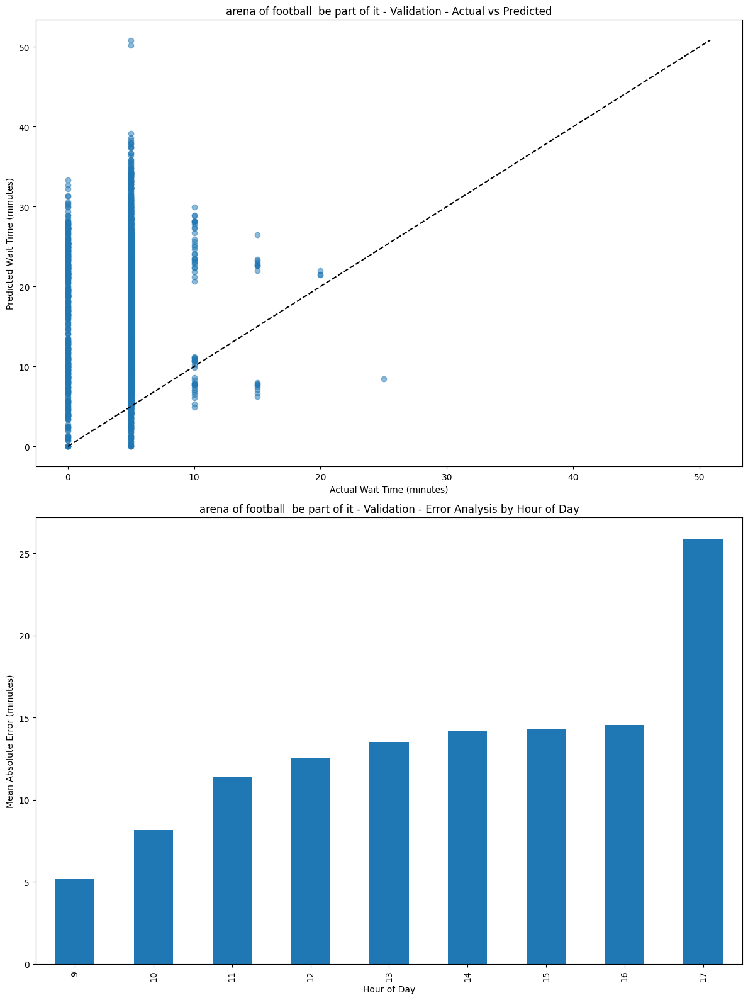

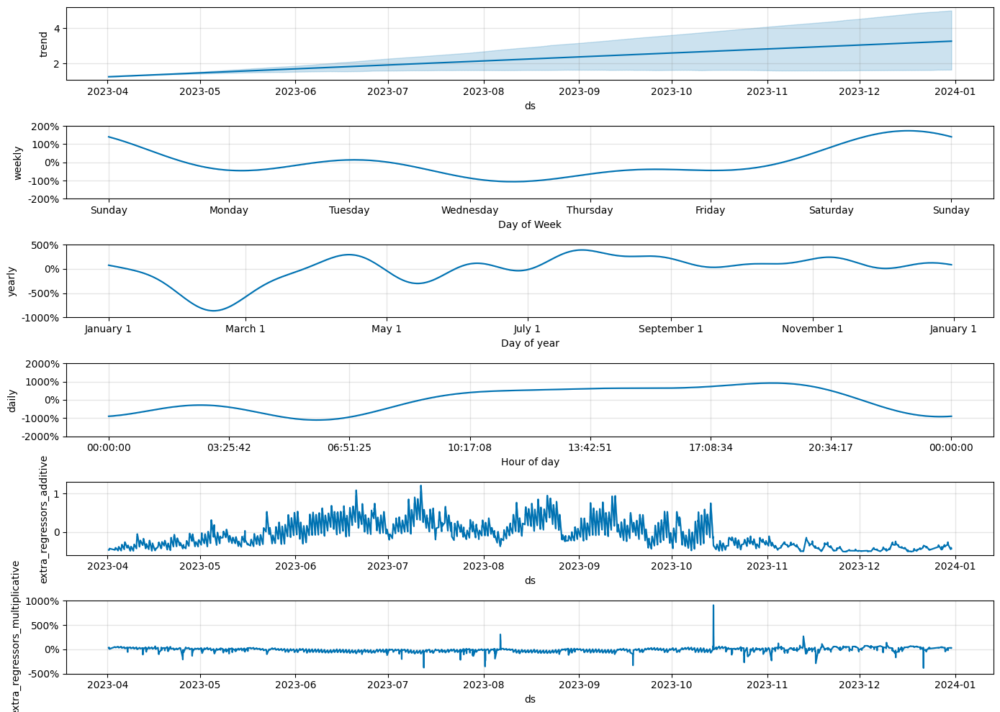

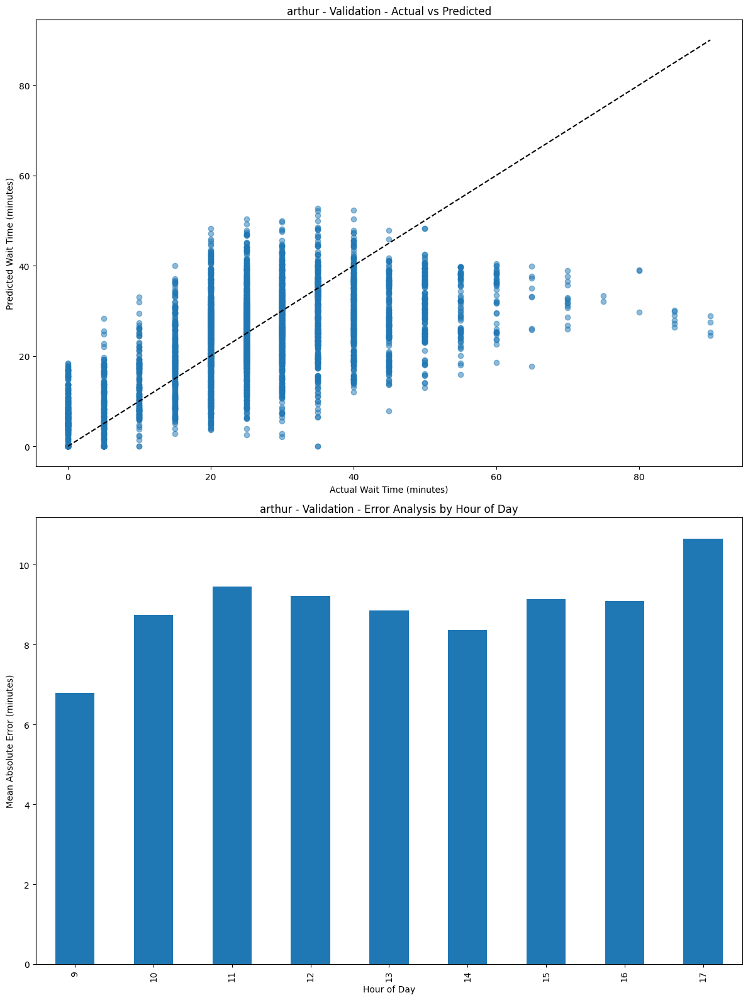

...

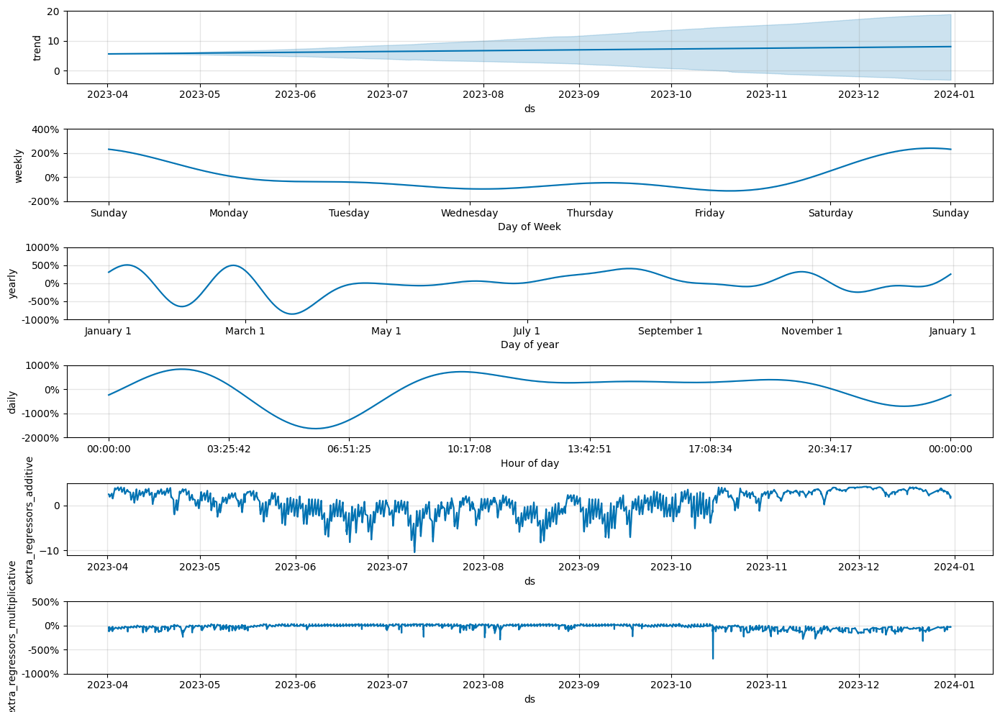

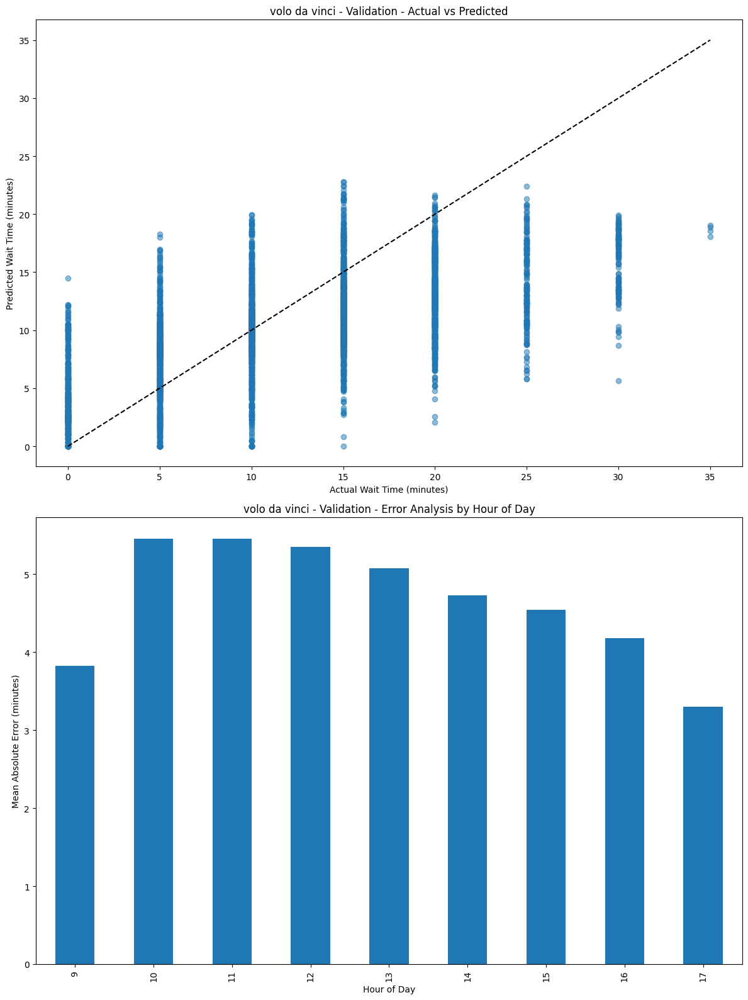

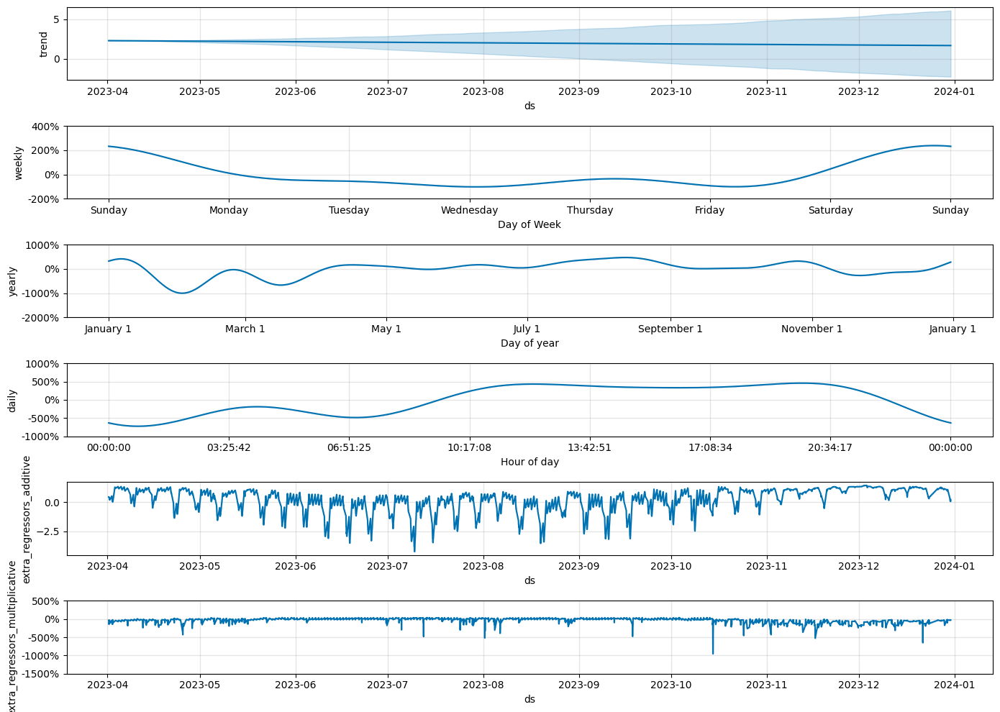

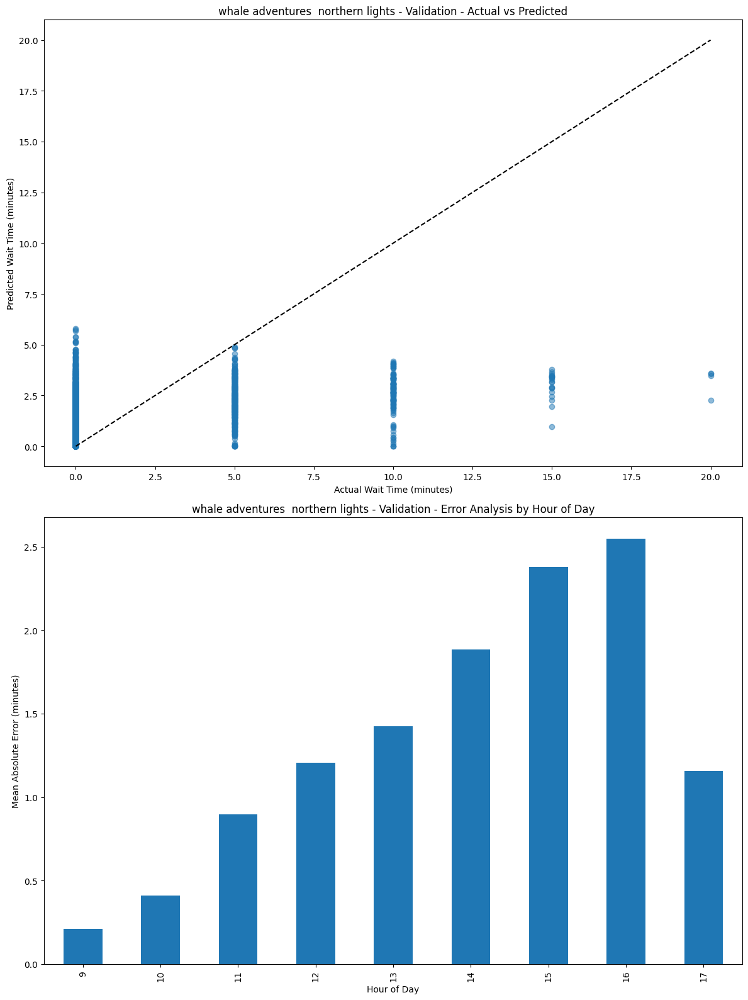

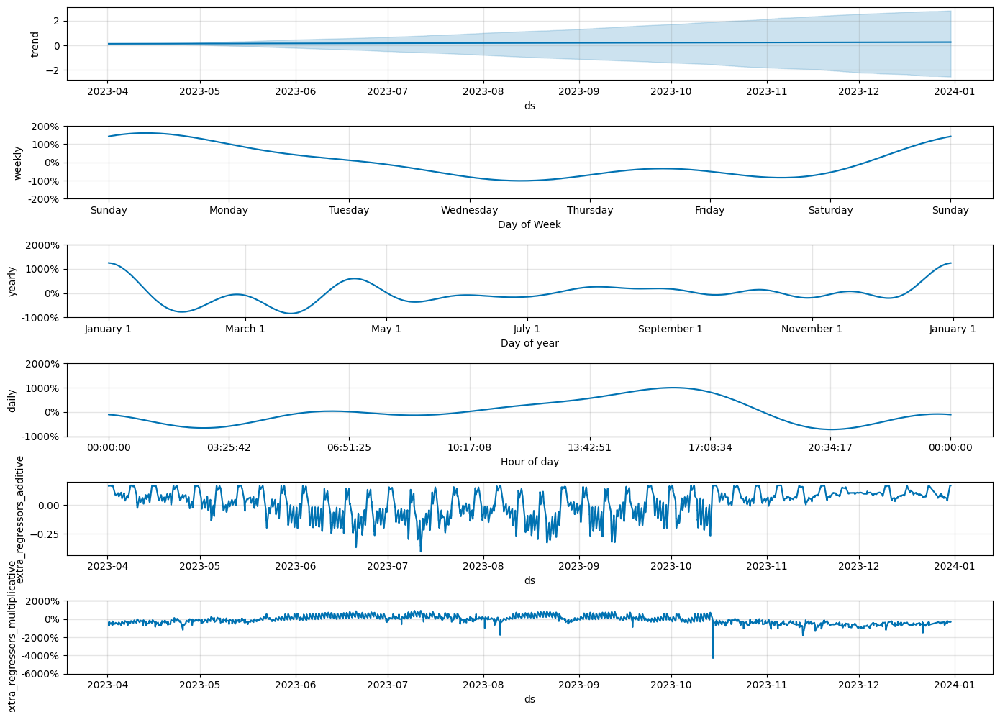

In [9]:
# Load the data
print("Loading data...")
data = load_data("../data/processed/ep/final_cleaned_processed_wait_times.parquet")
print(f"Loaded data with {len(data)} rows")

# Define time periods for splitting
train_years, val_year, test_year = list(range(2017, 2023)), 2023, 2024

# Split the data
train_data, val_data, test_data = split_data(data, train_years, val_year, test_year)

# Get all rides in the dataset
all_rides = get_all_rides(data)
print(f"Found {len(all_rides)} rides in the dataset:")
for i, ride in enumerate(all_rides):
    print(f"{i+1}. {ride}")

# Set output directory for models and results
output_dir = "../models/prophet_enhanced/"

# Process all rides
results = process_all_rides(
    all_rides=all_rides,
    train_data=train_data,
    val_data=val_data,
    output_dir=output_dir,
    resume=True  # Resume from checkpoint if available
)

## Load and Analyze Results

Top 10 rides by validation MAE:


,Ride Name,Validation MAE,Validation RMSE,Validation MAPE,Data Counts
0,madame freudenreich curiosits,0.084198,0.528359,99.801832,"Train: 16080, Val: 4233"
1,whale adventures northern lights,1.420113,2.243586,59.862967,"Train: 17771, Val: 4229"
2,kolumbusjolle,1.615730,2.090952,27.174602,"Train: 17749, Val: 4234"
3,old mac donalds tractor fun,1.684594,2.350709,69.228222,"Train: 17743, Val: 4232"
4,poppy towers,1.743932,2.425528,28.086764,"Train: 17706, Val: 4231"
5,castello dei medici,3.694392,4.499487,29.325045,"Train: 18321, Val: 4232"
6,vienna wave swing glckspilz,3.821621,4.464488,71.421103,"Train: 13798, Val: 4234"
7,eurotower,3.828551,5.063832,54.005006,"Train: 17761, Val: 4234"
8,josefinas magical imperial journey,3.850703,6.512019,99.466346,"Train: 18460, Val: 4234"
9,atlantis adventure,4.141690,5.296255,59.260204,"Train: 17712, Val: 4233"


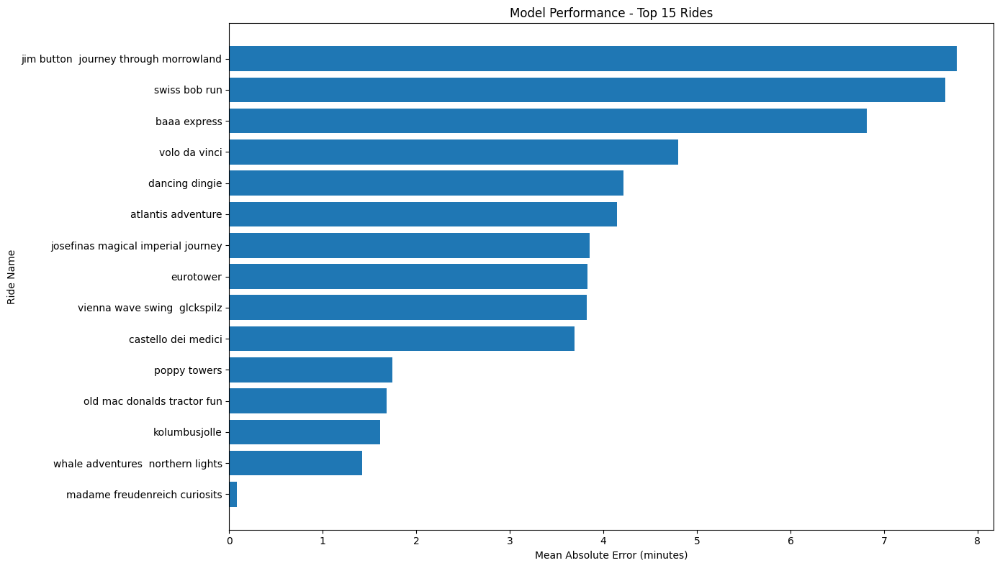

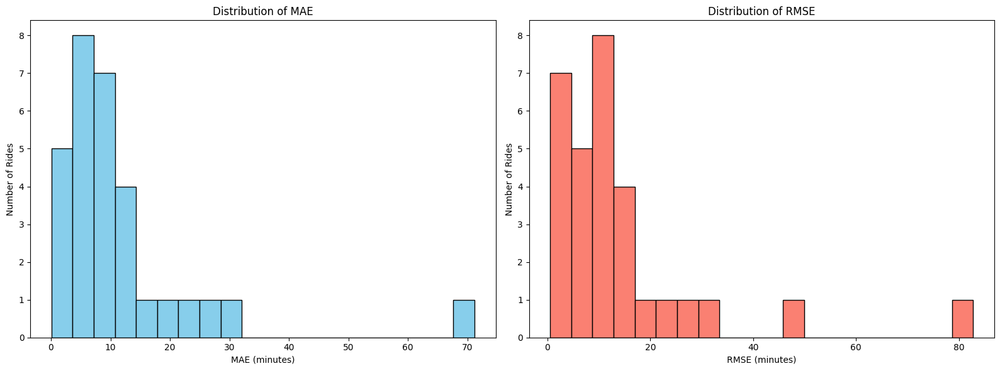

In [10]:
def analyze_results(output_dir="../models/prophet_enhanced/"):
    """Load and analyze saved model results."""
    # Load the summary results
    summary_path = os.path.join(output_dir, "model_summary.csv")
    if os.path.exists(summary_path):
        summary_df = pd.read_csv(summary_path)
        
        # Display the top 10 performing rides
        print("Top 10 rides by validation MAE:")
        display(summary_df.head(10))
        
        # Create a visualization of performance
        plt.figure(figsize=(14, 8))
        
        # Sort rides by validation MAE for the plot (show top 15)
        top_rides = summary_df.sort_values("Validation MAE").head(15)
        
        # Plot bars for MAE
        plt.barh(top_rides["Ride Name"], top_rides["Validation MAE"])
        
        plt.xlabel("Mean Absolute Error (minutes)")
        plt.ylabel("Ride Name")
        plt.title("Model Performance - Top 15 Rides")
        plt.tight_layout()
        
        plt.savefig(os.path.join(output_dir, "top_rides_mae.png"))
        plt.show()
        
        # Analyze distribution of metrics
        plt.figure(figsize=(16, 6))
        
        plt.subplot(1, 2, 1)
        plt.hist(summary_df["Validation MAE"], bins=20, color='skyblue', edgecolor='black')
        plt.xlabel("MAE (minutes)")
        plt.ylabel("Number of Rides")
        plt.title("Distribution of MAE")
        
        plt.subplot(1, 2, 2)
        plt.hist(summary_df["Validation RMSE"], bins=20, color='salmon', edgecolor='black')
        plt.xlabel("RMSE (minutes)")
        plt.ylabel("Number of Rides")
        plt.title("Distribution of RMSE")
        
        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, "metrics_distribution.png"))
        plt.show()
        
        return summary_df
    else:
        print("Summary file not found. Run the processing pipeline first.")
        return None

# Run analysis if summary exists
summary_df = analyze_results()

In [11]:
summary_df.describe()

,Validation MAE,Validation RMSE,Validation MAPE
count,30.000000,30.000000,30.000000
mean,11.168949,14.045861,104.420717
std,13.605086,16.401913,122.828147
min,0.084198,0.528359,27.174602
25%,3.834089,5.121938,52.063590
50%,7.935003,9.696470,88.981637
75%,11.970716,14.922646,99.272350
max,71.179908,82.788433,706.587977
